In [1]:
using Flux, MLDatasets, ImageCore, StatsBase
using MLDatasets: MNIST
using Flux: train!, update!
using Flux: onehot, throttle, crossentropy, relu, sigmoid
using StatsBase: sample

In [2]:
using Plots
using Clustering
using JLD
using Random
using Zygote: @adjoint
using LinearAlgebra

In [3]:
using Flux
using Flux: Data.DataLoader
using Flux: onehotbatch, onecold, crossentropy
using Flux: @epochs
using Statistics
using MLDatasets

# load full training set
train_x, train_y = MNIST.traindata();

train_x_vec = [vec(train_x[:, :, i]) for i = 1:60000];
train_y_hot = [onehot(train_y[i], 0:9) for i = 1:60000];

# load full test set
test_x,  test_y  = MNIST.testdata();

test_x_vec = [vec(test_x[:, :, i]) for i = 1:10000];
test_y_hot = [onehot(test_y[i], 0:9) for i = 1:10000];

traindata = [(train_x_vec[i], train_y_hot[i]) for i = 1:60000];
testdata = [(test_x_vec[i], test_y_hot[i]) for i = 1:10000];

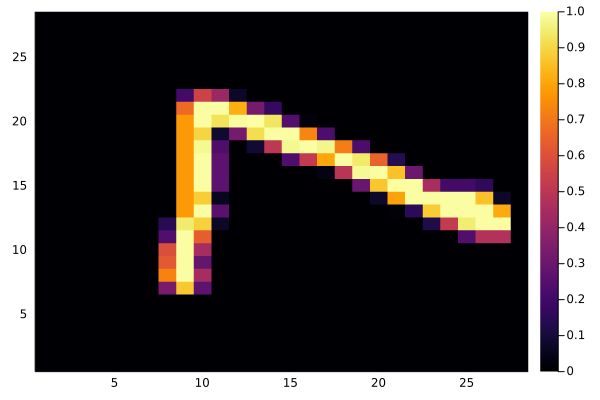

In [4]:
gr()
heatmap(test_x[:, :, 1])

In [5]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct PerturbRegModel
    model::Any # maybe change this type to Array{Any}
    num_models::Int64
    params::Matrix{Float64}
    b::Vector{Float64}
end

function PerturbRegModel(
        model::Any,
        num_models::Int64,
        variance::Float64,
        num_params::Int64,
    )
    b = zeros((num_params))
    
    p = variance * randn(num_models, num_params);
    num_weights_layer = 0
    num_weights_prev = 0
    for layer in model
        if ~isempty(params(layer))
            fan_in, fan_out = Flux.nfan(size(layer.weight))
            num_weights = num_weights_prev + sum(length, params(layer))
            p[:, 1 + num_weights_prev:num_weights] .*= sqrt(2/(fan_in + fan_out))
            num_weights_prev = num_weights
        end
    end


    return PerturbRegModel(model, num_models, p, b)
end

# Overload call, so the object can be used as a function
function (m::PerturbRegModel)(x)
    model_id = rand(1:m.num_models)
    
    p, restruct = Flux.destructure(m.model)

    reparam_model = restruct(m.params[model_id, :] + m.b)
    return reparam_model(x)
end

In [32]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct PermutationModel
    model::Any # maybe change this type to Array{Any}
    parameters::Vector{Float64}
end

# Overload call, so the object can be used as a function
function (m::PermutationModel)(x)
    p, restruct = Flux.destructure(m.model)
    
    shuffle!(m.parameters)
    
    reparam_model = restruct(m.parameters)
    return reparam_model(x)
end

In [33]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct LinearSubspaceModel
    model::Any # maybe change this type to Array{Any}
    num_models::Int64
    reparams::Matrix{Float64}
    A::Matrix{Float64}
    variance::Float64
end

function LinearSubspaceModel(
        model::Any,
        num_models::Int64,
        model_variance::Float64,
        family_variance::Float64,
        num_params::Int64,
        num_reparams::Int64
    )
    A = zeros((num_params, num_reparams))

    reparams = model_variance*(randn(num_models, num_reparams));

    return LinearSubspaceModel(model, num_models, reparams, A, family_variance)
end


# Overload call, so the object can be used as a function
function (m::LinearSubspaceModel)(x)
    model_id = rand(1:m.num_models)
    
    params, restruct = Flux.destructure(m.model)
    
    random_A = randn(size(m.A));

    reparam_model = restruct((m.A + m.variance*random_A)*m.reparams[model_id, :])
    return reparam_model(x)
end

In [34]:
input_size = 784;
output_size = 128;

In [35]:
model = Chain(
    Dense(input_size, 16, relu),
    Dense(16, 10),
    softmax
)

Chain(
  Dense(784, 16, relu),                 # 12_560 parameters
  Dense(16, 10),                        # 170 parameters
  NNlib.softmax,
)                   # Total: 4 arrays, 12_730 parameters, 49.977 KiB.

In [36]:
num_models = 100
model_variance = 1.0
num_params = sum(length, params(model))

12730

In [37]:
perturbreg_model = PerturbRegModel(model, num_models, model_variance, num_params)

PerturbRegModel(Chain(Dense(784, 16, relu), Dense(16, 10), softmax), 100, [0.018252827291302034 0.09462835482395074 … -0.29289292374766895 -0.24991632807226685; 0.14439920758158073 -0.12678168779302684 … 0.19141124951552455 -0.04856458604745278; … ; -0.010854506045952067 0.0063267768038845875 … 0.18012637621787697 -0.0016713646460173788; -0.027698471094149996 -0.022054345129803598 … -0.3056937755969382 -0.17046185112833637], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])

In [38]:
#mat = Matrix{Float64}(I, num_params, num_params) 

In [39]:
#mat[shuffle([1:num_params]), :]

In [40]:
parameters = 0.01*randn(num_params)
shuffle_model = PermutationModel(model, parameters)
Flux.trainable(shuffle_model::PermutationModel) = (shuffle_model.parameters, )
Flux.params(shuffle_model)

Params([[-0.00012053658836731725, -0.0057208846481263, 0.0010476486579005706, -0.0034900909169420925, -2.5815969916450855e-5, 0.016354602352871, 0.00026539908798760715, 0.006921498270649092, 0.009113619505747121, -0.01010337549125475  …  -0.004043358138907802, 0.00952868231007706, 0.005820038375422545, -0.01010739579928353, -0.008142753990678257, -0.005826361060523428, -0.0013167856375685004, -0.018012480837577602, 0.011203437704753629, -0.01609116857843752]])

In [41]:
Flux.trainable(perturbreg_model::PerturbRegModel) = (perturbreg_model.b, )
Flux.params(perturbreg_model)

Params([[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

In [42]:
data_model = shuffle_model

PermutationModel(Chain(Dense(784, 16, relu), Dense(16, 10), softmax), [-0.00012053658836731725, -0.0057208846481263, 0.0010476486579005706, -0.0034900909169420925, -2.5815969916450855e-5, 0.016354602352871, 0.00026539908798760715, 0.006921498270649092, 0.009113619505747121, -0.01010337549125475  …  -0.004043358138907802, 0.00952868231007706, 0.005820038375422545, -0.01010739579928353, -0.008142753990678257, -0.005826361060523428, -0.0013167856375685004, -0.018012480837577602, 0.011203437704753629, -0.01609116857843752])

In [43]:
function loss(x, y)
    loss = 0
    num = 1
    for i = 1:num
        loss += Flux.Losses.crossentropy(data_model(x), y)
    end
    return loss/num
end
accuracy(x, y) = mean(onecold.(x) .== onecold.(y))

accuracy (generic function with 1 method)

In [44]:
#loss(x, y) = Flux.Losses.crossentropy(data_model(x), y)
opt = ADAM(.001)
ps = Flux.params(data_model)

# I can just unroll the update!
# function and write out the parameter updates myself, so that all parameters are updated in the same way.

# TODO
# Should maybe look into the variance chosen specially for feedforward models implemented in Flux
num_runs = 1
for j in 1:num_runs
    trainsample = sample(traindata, 30, replace=false);

    epochs = 200
    for epoch in 1:epochs
        loss_total = 0
        for (i, d) in enumerate(trainsample)

            # TODO
            # Choose small random sub sample from n sample above and provide to the loss function
            gs = gradient(ps) do
              training_loss = loss(d...)
              # Code inserted here will be differentiated, unless you need that gradient information
              # it is better to do the work outside this block.
              return training_loss
            end
            loss_total += loss(d...)
            if i%10==0
                println(loss_total/i)
            end
            # Insert whatever code you want here that needs training_loss, e.g. logging.
            # logging_callback(training_loss)
            # Insert what ever code you want here that needs gradient.
            # E.g. logging with TensorBoardLogger.jl as histogram so you can see if it is becoming huge.
            update!(opt, ps, gs)
        end
        println(epoch)
    end
    if typeof(data_model) == PerturbRegModel
        p, restruct = Flux.destructure(data_model.model)
        testing_model = restruct(data_model.b)
    else
        testing_model = data_model
    end
    print("NUMBER OF RUNS: ")
    println(j)
    print("ACCURACY: ")
    println(accuracy(testing_model.(test_x_vec), test_y_hot))
end

LoadError: Mutating arrays is not supported -- called setindex!(::Vector{Float64}, _...)

In [287]:
#save("3_parameter_invariant_linear_model.jld", "A", data_model.A)
#R = load("9_parameter_invariant_model.jld")["A"]

In [183]:
testing_model = data_model
if typeof(data_model) == PerturbRegModel
    p, restruct = Flux.destructure(data_model.model)
    testing_model = restruct(data_model.b)
else
    testing_model = data_model
end

Chain(
  Dense(784, 32, relu),                 # 25_120 parameters
  Dense(32, 10),                        # 330 parameters
  NNlib.softmax,
)                   # Total: 4 arrays, 25_450 parameters, 199.078 KiB.

In [184]:
print("ACCURACY: ")
println(accuracy(testing_model.(test_x_vec), test_y_hot))
testing_ps = Flux.params(testing_model)
ps = testing_ps

ACCURACY: 0.5058


Params([[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.037685053403245475, 0.04303507159835358, 0.016327873887822458, -0.030876061543062706, 0.006343067219380916, 0.14451330006860874, 0.05387246340882533, 0.02576763832229206, 0.02786580120840568, -0.030919315711524484  …  -0.030842891273253483, -0.006757335988433635, 0.1224519439285252, -0.032809202967127256, 0.07566101989133363, -0.014377892993588567, 0.18192578101203655, 0.12341400759764237, -0.031228407131314192, -0.045577550160770426], [-0.24310581555097385 -0.06200712404882317 … -0.007833302822156486 -0.42451945306575406; -0.6286083381483335 0.24545045105888105 … 0.003378415433766788 -0.338256234973082; … ; -0.7337356849571598 -0.08690139829044151 … 0.00029005417159488526 0.3770418841794938; 0.3568024685072198 -0.12690004949153158 … -0.030286126391122253 -0.4930026377790616], [0.18608676934667978, 0.034824259851219445, -0.09598791856464625, -0.18974087788009295, 0.10989216360640083, -0.0844630

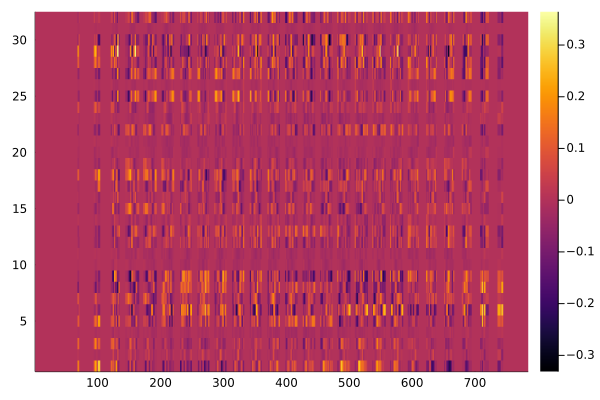

In [185]:
gr()
heatmap(ps[1])

In [127]:
vec_set = ps[1]
distance_matrix = zeros((output_size, output_size))
for i = 1:output_size
    for j = 1:output_size
        ith = vec_set[i, :]
        jth = vec_set[j, :]
        distance_matrix[i, j] = exp(-dot(ith, jth)/(norm(ith)*norm(jth)))
    end
end

In [128]:
clust_y = hclust(distance_matrix)

Hclust{Float64}([-72 -73; -24 -108; … ; -30 125; -125 126], [0.7521429657936096, 0.7945091724395752, 0.818992018699646, 0.8205482959747314, 0.8277503848075867, 0.8291553258895874, 0.8298221230506897, 0.8309666514396667, 0.8327174186706543, 0.8348236083984375  …  0.9257132411003113, 0.9268999695777893, 0.9269798994064331, 0.9276695847511292, 0.9277872443199158, 0.9284417033195496, 0.9296767115592957, 0.9315510392189026, 0.9332455992698669, 0.9333212375640869], [125, 30, 69, 79, 42, 81, 58, 60, 75, 97  …  36, 47, 116, 94, 40, 126, 8, 19, 91, 95], :single)

In [129]:
num = input_size
distance_matrix = zeros((num, num))
for i = 1:num
    for j = 1:num
        ith = vec_set[:, i]
        jth = vec_set[:, j]
        distance_matrix[i, j] = exp(-dot(ith, jth)/((norm(ith) + .0001)*(norm(jth) + .0001)))
    end
end

In [130]:
clust_x = hclust(distance_matrix)

Hclust{Float64}([-740 -768; -688 -689; … ; -417 781; -751 782], [0.5324957409095111, 0.5468176896197945, 0.553227002058987, 0.5570312529401138, 0.5600302030304815, 0.5629125333493559, 0.5691459793743181, 0.5774869270136053, 0.579495277210195, 0.5808650577382823  …  0.801597623292254, 0.8020630158260876, 0.8021258332904438, 0.8021442090512262, 0.8064799866708389, 0.8077007136153185, 0.808028842329921, 0.8083459112920466, 0.8092957540816261, 0.8169056197934241], [751, 417, 85, 170, 391, 560, 756, 500, 586, 587  …  704, 91, 728, 753, 230, 379, 71, 160, 107, 168], :single)

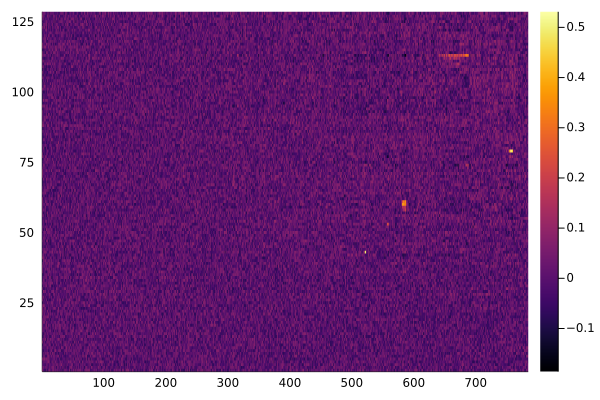

In [131]:
gr()
heatmap(ps[1][clust_y.order, clust_x.order])

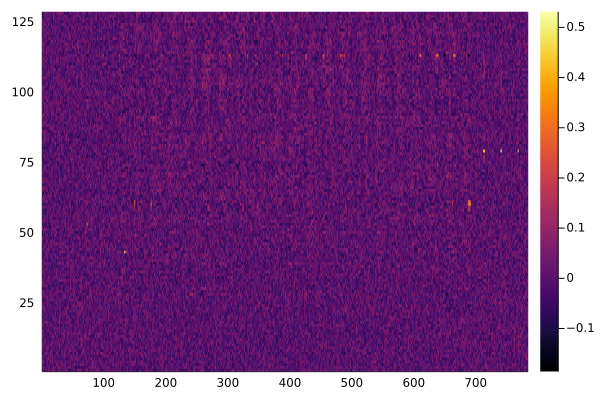

In [132]:
gr()
heatmap(ps[1][clust_y.order, :])

In [133]:
gr()
mat = ps[1][clust_y.order, :]
anim = @animate for i = 1:output_size
    heatmap(rotr90(rotr90(rotr90(reshape(mat[i, :], (28, 28))))), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_zSaas4", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000119.png", "000120.png", "000121.png", "000122.png", "000123.png", "000124.png", "000125.png", "000126.png", "000127.png", "000128.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
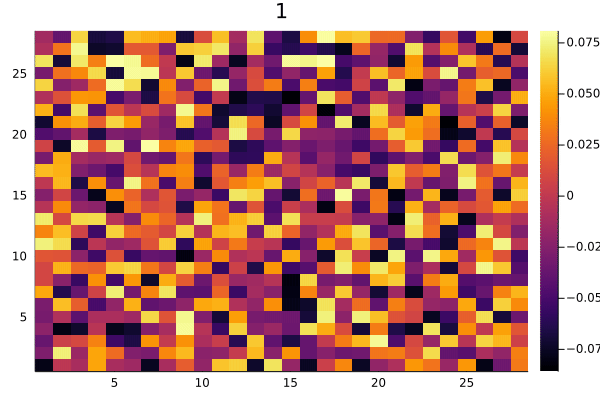

In [134]:
gif(anim, "tutorial_anim_fps30.gif", fps = 3)

In [244]:
gr()
mat = ps[1][clust_y.order, clust_x.order]
anim = @animate for i = 1:input_size
    heatmap(reshape(mat[:, i], (8, 8)), clim=(-.5, .5), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_bDG4Uq", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000775.png", "000776.png", "000777.png", "000778.png", "000779.png", "000780.png", "000781.png", "000782.png", "000783.png", "000784.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
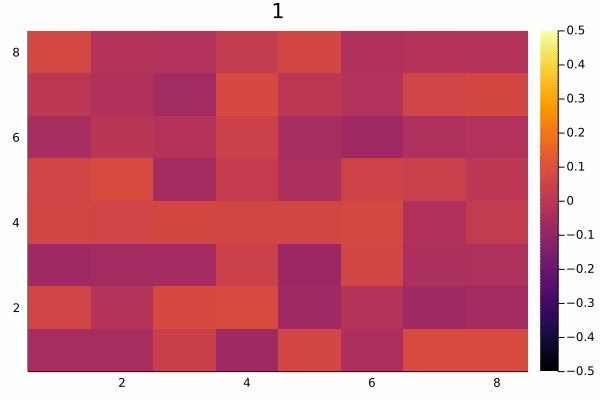

In [245]:
gif(anim, "tutorial_anim_fps30.gif", fps = 28)